### **Notebook Summary**
This notebook develops a hybrid **AI-vs-Human art classifier** that fuses **semantic features** from **CLIP embeddings** with **stylistic signals** from the **Stable Diffusion Turbo VAE latent space**. It begins by **cloning and running the [img2img-turbo repository](https://github.com/GaParmar/img2img-turbo)**, preparing and splitting a [**Kaggle dataset**](https://www.kaggle.com/datasets/doctorstrange420/real-and-fake-ai-generated-art-images-dataset) of human and AI-generated artwork, and **augmenting images** using diffusion-based style transformations to enhance class robustness. Extracted **CLIP and VAE features** are concatenated into **768-dimensional vectors** and used to train a lightweight **Fusion-MLP classifier** achieving strong validation accuracy. The notebook concludes with **Grad-CAM visualizations** over the **VAE encoder** and **U-Net attention layers**, highlighting the regions and textures most influential in distinguishing AI from human art.

#### **Pipeline Overview**

**1. Input:**  
Images from the Kaggle *AI vs Human Art* dataset (both AI-generated and human-made)

**2. Data Augmentation:**

**img2img-turbo:** creates stylized varients of training data to exaggerate class-specific patterns
- **AI-Generated Art Prompt:**  
    *“digital futuristic artwork, smooth vivid colors, hyperrealistic lighting”*  
- **Human Art Prompt:**  
    *“traditional painting, brush strokes, canvas texture, artistic imperfections”*  

**2. Dual Feature Extraction:**  
- **CLIP Encoder:** captures **semantic & stylistic meaning**  
  → "What the image looks like"  
- **SD-Turbo VAE Encoder:** `(latent-space engine INSIDE img2img-turbo)` captures **generator fingerprints**  
  → "How the image was encoded by a diffusion model"

**3. Feature Fusion:**  
- Concatenate **512-D CLIP** + **256-D VAE** → **768-D fused vector**

**4. Classification:**  
- A small **MLP classifier** learns to separate AI vs Human based on fused features

**5. Output:**  
- **Prediction:** *AI-Generated* or *Human-Made* artwork

---

**Result:**  
This fusion allows the model to reason both **semantically** (content & style)  
and **structurally** (generator signatures), creating a more robust and explainable classifier.

---
**Explainability:**  
- Grad-CAM is applied to the **SD-Turbo VAE encoder** during the **feature extraction stage**, before any classifier training.  
At this point, the encoder is **not told whether an image is AI-generated or human-made** — it simply encodes all inputs into latent representations.  

- Grad-CAM visualizations reveal which **textural and structural regions** (e.g., brush strokes, lighting gradients, surface smoothness) the VAE focuses on when encoding each image, providing insight into how the model later distinguishes AI vs human art.

---
**Next Steps:**
- Implement additional explainability for CLIP embeddings.
- Utilize an LLM for explainability.
- Try additional models beyond MLP.

### Clone Img2Img Repo

In [ ]:
!git clone https://github.com/GaParmar/img2img-turbo.git
%cd img2img-turbo

Cloning into 'img2img-turbo'...
remote: Enumerating objects: 255, done.
remote: Counting objects: 100% (118/118), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 255 (delta 89), reused 62 (delta 62), pack-reused 137 (from 1)
Receiving objects: 100% (255/255), 31.91 MiB | 32.03 MiB/s, done.
Resolving deltas: 100% (128/128), done.
/content/img2img-turbo


Install dependencies

In [ ]:
!pip install -r requirements.txt

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-install-0hvmze9h/clip_91959b67dfae4406b1a1f1f4f491e93f
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-0hvmze9h/clip_91959b67dfae4406b1a1f1f4f491e93f
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of xformers to determine which version is compatible with other requirements. This could take a while.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 31.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.8 MB/s eta 0:00:00


Run a sample Pix2Pix-Turbo example (edge → image)

In [ ]:
!python src/inference_paired.py \
  --model_name "edge_to_image" \
  --input_image "assets/examples/bird.png" \
  --prompt "a blue bird" \
  --output_dir "outputs"

2025-11-19 01:05:42.179341: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763514342.224609     547 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763514342.234855     547 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1763514342.260948     547 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763514342.260996     547 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763514342.261004     547 computation_placer.cc:177] computation placer alr

Display generated image

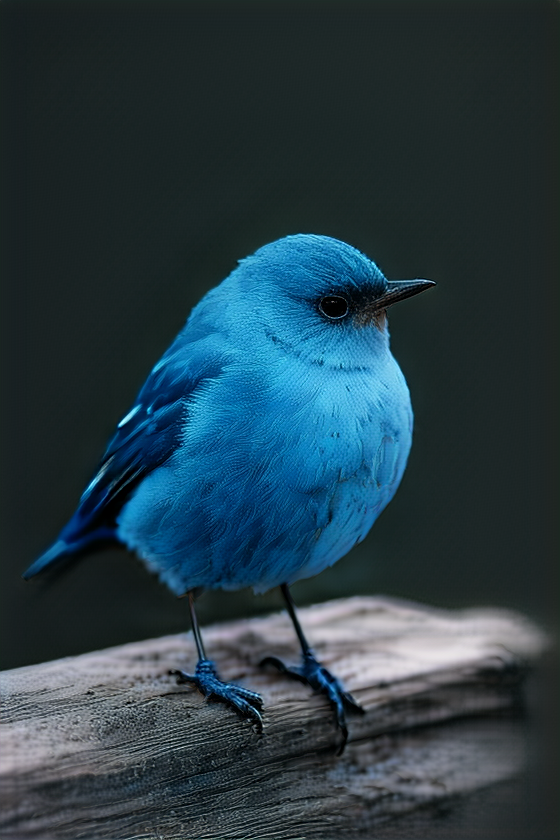

In [ ]:
from PIL import Image
from IPython.display import display

display(Image.open("outputs/bird.png"))

### Load Kaggle Dataset

*Kaggle data stored in Drive for backup*

In [ ]:
# Install the Kaggle API client if not already installed
!pip install -q kaggle

# Mount Google Drive so you can access kaggle.json securely
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os, shutil

# Create the hidden .kaggle directory where API credentials must live
os.makedirs(os.path.expanduser("~/.kaggle"), exist_ok=True)

# Copy API key file from Drive
src_kaggle = "/content/drive/MyDrive/Deep_Learning_Final_Project/notebooks/kaggle.json"
dst_kaggle = os.path.expanduser("~/.kaggle/kaggle.json")
if os.path.exists(dst_kaggle):
    os.remove(dst_kaggle)
shutil.copy(src_kaggle, dst_kaggle)

# Restrict file permissions so only you can read the key
!chmod 600 ~/.kaggle/kaggle.json

# Download the AI-vs-Human Art dataset from Kaggle
dataset_zip = "ai-and-human-art-classification.zip"
if os.path.exists(dataset_zip):
    os.remove(dataset_zip)
!kaggle datasets download -d kausthubkannan/ai-and-human-art-classification --force

# Unzip into a local folder named "data"
data_dir = "data"
target_dir = os.path.join(data_dir, "ai_art_classification")
if os.path.exists(target_dir):
    shutil.rmtree(target_dir)
os.makedirs(data_dir, exist_ok=True)
!unzip -q ai-and-human-art-classification.zip -d data/

print("✅ Dataset refreshed and ready at:", target_dir)

Mounted at /content/drive
Dataset URL: https://www.kaggle.com/datasets/kausthubkannan/ai-and-human-art-classification
License(s): DbCL-1.0
 99% 2.18G/2.21G [00:14<00:00, 242MB/s]
100% 2.21G/2.21G [00:14<00:00, 163MB/s]
✅ Dataset refreshed and ready at: data/ai_art_classification


Split into train/val/test

In [ ]:
import os, shutil, random

base_dir = "data/ai_art_classification/train"
new_base = "data/ai_art_split"

# remove old split folder if it exists so rerunning doesn't duplicate files
if os.path.exists(new_base):
    shutil.rmtree(new_base)

# create new folder structure
for split in ["train", "val", "test"]:
    for cls in ["AI_GENERATED", "NON_AI_GENERATED"]:
        os.makedirs(os.path.join(new_base, split, cls), exist_ok=True)

# define split ratios (70% train, 15% val, 15% test)
split_ratios = {'train': 0.7, 'val': 0.15, 'test': 0.15}
random.seed(42)

# go through each class folder and split its images according to ratios
for cls in ["AI_GENERATED", "NON_AI_GENERATED"]:
    src_dir = os.path.join(base_dir, cls)
    all_imgs = [f for f in os.listdir(src_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(all_imgs)
    n = len(all_imgs)

    # compute split cutoffs
    train_cut = int(split_ratios['train'] * n)
    val_cut = int(split_ratios['val'] * n)

    # assign each split a portion of images
    splits = {
        'train': all_imgs[:train_cut],
        'val': all_imgs[train_cut:train_cut + val_cut],
        'test': all_imgs[train_cut + val_cut:]
    }

    # copy files into their new split folders
    for split, files in splits.items():
        dest = os.path.join(new_base, split, cls)
        for f in files:
            shutil.copy(os.path.join(src_dir, f), os.path.join(dest, f))

print("Done splitting into train/val/test folders!")

✅ Done splitting into train/val/test folders!


Load dataset with PyTorch

(Fix sympy version error first)

In [ ]:
!pip install sympy==1.12 --quiet
import sympy
print("Sympy version:", sympy.__version__)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 32.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.8.0+cu126 requires sympy>=1.13.3, but you have sympy 1.12 which is incompatible.
Sympy version: 1.12


In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# training transformations add random flips for augmentation
train_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# validation/test transforms are deterministic (no augmentation)
test_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# load datasets from new split folders
train_ds = datasets.ImageFolder("data/ai_art_split/train", transform=train_tfms)
val_ds   = datasets.ImageFolder("data/ai_art_split/val", transform=test_tfms)
test_ds  = datasets.ImageFolder("data/ai_art_split/test", transform=test_tfms)

# create dataloaders for batching and shuffling
train_dl = DataLoader(train_ds, batch_size=32, shuffle=True)
val_dl   = DataLoader(val_ds, batch_size=32)
test_dl  = DataLoader(test_ds, batch_size=32)

# print summary of dataset sizes and classes
print(train_ds.classes)
print(f"Train: {len(train_ds)} | Val: {len(val_ds)} | Test: {len(test_ds)}")

['AI_GENERATED', 'NON_AI_GENERATED']
Train: 13031 | Val: 2792 | Test: 2795


Display some of the dataset we loaded

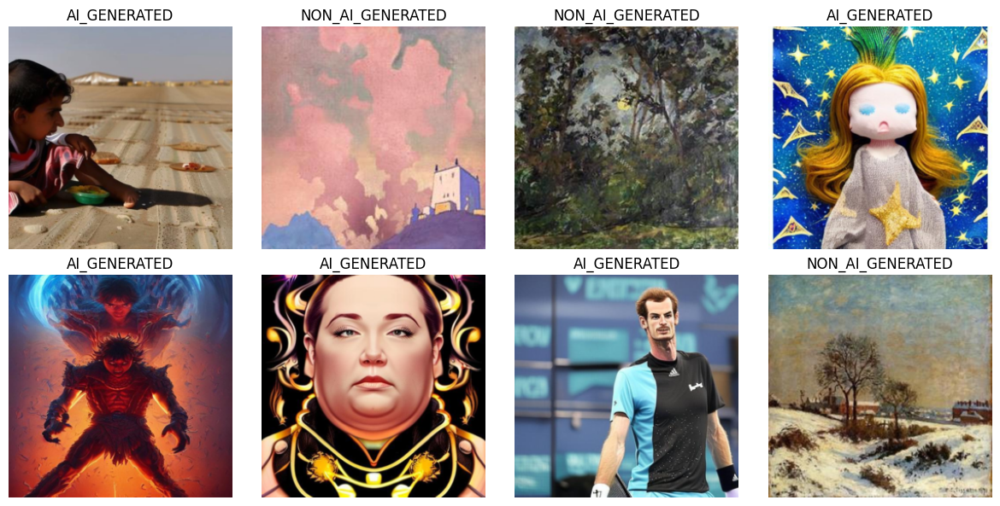

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def denorm(img_tensor):
    img_tensor = img_tensor * 0.5 + 0.5  # reverse normalization
    return np.clip(img_tensor.permute(1, 2, 0).numpy(), 0, 1)

# get one batch of images
images, labels = next(iter(train_dl))
classes = train_ds.classes

plt.figure(figsize=(12, 6))
for i in range(8):  # show 8 sample images
    plt.subplot(2, 4, i+1)
    plt.imshow(denorm(images[i]))
    plt.title(classes[labels[i].item()])
    plt.axis('off')
plt.tight_layout()
plt.show()

### Preprocess with img2img
*Augmented images already saved in Drive, no need to re-run all cells:*
`/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented`

Only run last cell in this markdown, titled "**Finish dataset preparation:** Combine original + augmented data into PyTorch loaders"

Load turbo pipeline

In [ ]:
# Import the lightweight one-step Stable Diffusion model (img2img-turbo)
from diffusers import StableDiffusionImg2ImgPipeline
import torch
from PIL import Image
import os

# Automatically use GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the pre-trained Stable Diffusion Turbo model (faster and smaller than full SD)
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "stabilityai/sd-turbo",
    torch_dtype=torch.float16
).to(device)

KeyboardInterrupt: 

**Preprocess:** Create new, AI-generated augmentations of existing training images using img2img-turbo diffusion model.

Goal: Teach our classifier to recognize style-level differences between AI and human art more robustly by exaggerating them with controlled image transformations.

In [ ]:
import os, random
from PIL import Image

# Keep track of main dataset location
split_root = "data/ai_art_split"
aug_root = "data/ai_art_augmented"
os.makedirs(aug_root, exist_ok=True)

# Define stylistic prompts that enhance each class
prompt_base = {
    "AI_GENERATED": "digital futuristic artwork, smooth vivid colors, hyperrealistic lighting",
    "NON_AI_GENERATED": "traditional painting, brush strokes, canvas texture, artistic imperfections"
}

def turbo_augment(input_dir, output_dir, prompt_dict, num_images=100):
    """
    Generate additional stylized versions of images using the img2img-turbo model.
    These augmentations help the classifier learn more robust representations
    by exaggerating stylistic differences between AI and human art.
    """
    classes = ["AI_GENERATED", "NON_AI_GENERATED"]
    generated_files = []

    for c in classes:
        src = os.path.join(input_dir, "train", c)
        dst = os.path.join(output_dir, "train", c)
        os.makedirs(dst, exist_ok=True)

        # Select a random subset for augmentation
        all_imgs = [f for f in os.listdir(src) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        random.shuffle(all_imgs)
        imgs = all_imgs[:num_images]

        for img_name in imgs:
            img_path = os.path.join(src, img_name)
            image = Image.open(img_path).convert("RGB").resize((512,512))
            prompt = prompt_dict[c]

            # Generate stylized variant through img2img-turbo
            out = pipe(
                prompt=prompt,
                image=image,
                strength=0.4,        # how much to modify (low = subtle style shift)
                guidance_scale=0.0   # rely on visual content more than text
            ).images[0]

            out.save(os.path.join(dst, f"turbo_{img_name}"))
            generated_files.append(f"turbo_{img_name}")

    return generated_files

# Run augmentation process
augmented = turbo_augment(split_root, aug_root, prompt_base, num_images=300) # start at 300 images
print(f"Generated {len(augmented)} augmented training images.")

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

✅ Generated 600 augmented training images.


**Preprocess V2:** do the same preprocessing but save before and after pics in Drive in *pairs* folder.

Format: Before pic | After pic

In [ ]:
import os, random
from PIL import Image, ImageOps

# Base dirs
split_root = "data/ai_art_split"
aug_root = "data/ai_art_augmented"
os.makedirs(aug_root, exist_ok=True)

# Style prompts per class
prompt_base = {
    "AI_GENERATED": "digital futuristic artwork, smooth vivid colors, hyperrealistic lighting",
    "NON_AI_GENERATED": "traditional painting, brush strokes, canvas texture, artistic imperfections"
}

def turbo_augment_with_pairs(input_dir, output_dir, prompt_dict, num_images=100):
    """
    Augment images using img2img-turbo and save:
      1. Individual augmented images (as before)
      2. Side-by-side before/after comparisons for quick visual inspection
    """
    classes = ["AI_GENERATED", "NON_AI_GENERATED"]
    generated_files = []

    for c in classes:
        src = os.path.join(input_dir, "train", c)
        dst = os.path.join(output_dir, "train", c)
        pair_dir = os.path.join(output_dir, "pairs", c)
        os.makedirs(dst, exist_ok=True)
        os.makedirs(pair_dir, exist_ok=True)

        # choose subset
        all_imgs = [f for f in os.listdir(src) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        random.shuffle(all_imgs)
        imgs = all_imgs[:num_images]

        for img_name in imgs:
            img_path = os.path.join(src, img_name)
            image = Image.open(img_path).convert("RGB").resize((512, 512))
            prompt = prompt_dict[c]

            # generate stylized version
            out = pipe(
                prompt=prompt,
                image=image,
                strength=0.4,
                guidance_scale=0.0
            ).images[0]

            out_name = f"turbo_{img_name}"
            out_path = os.path.join(dst, out_name)
            out.save(out_path)
            generated_files.append(out_path)

            # create & save before/after composite
            before = ImageOps.expand(image, border=5, fill="white")
            after = ImageOps.expand(out, border=5, fill="white")
            pair = Image.new("RGB", (before.width * 2, before.height), "white")
            pair.paste(before, (0, 0))
            pair.paste(after, (before.width, 0))

            pair.save(os.path.join(pair_dir, f"pair_{img_name}"))

    return generated_files

# run augmentation
augmented = turbo_augment_with_pairs(split_root, aug_root, prompt_base, num_images=300)
print(f"Generated {len(augmented)} augmented training images + saved before/after pairs.")

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

✅ Generated 600 augmented training images + saved before/after pairs.


**Save above images to Drive**

In [ ]:
import shutil

# Define where to store them permanently in Drive
drive_backup_dir = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented"

# Create the folder (and overwrite old backup if needed)
if os.path.exists(drive_backup_dir):
    print("Backup folder already exists. Removing and replacing old version...")
    shutil.rmtree(drive_backup_dir)

# Copy everything from local to Drive
shutil.copytree("data/ai_art_augmented", drive_backup_dir)

print(f"Augmented images saved to Drive: {drive_backup_dir}")

⚠️ Backup folder already exists. Removing and replacing old version...
✅ Augmented images saved to Drive: /content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented


Print a few example pairs

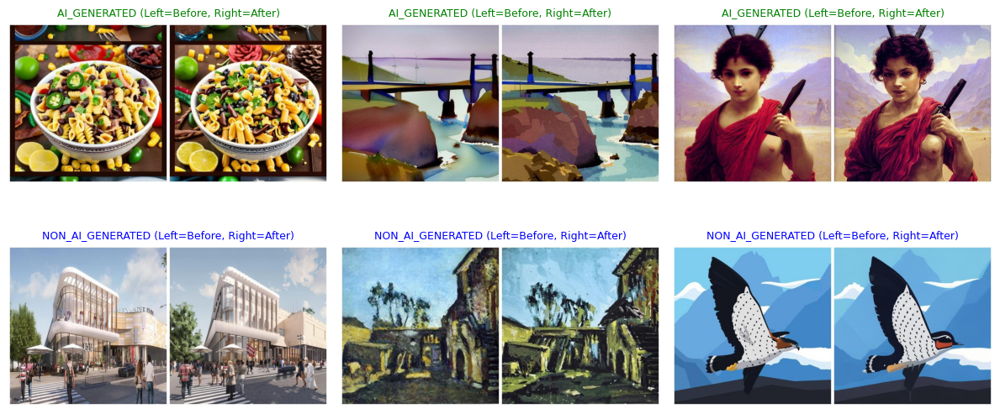

In [ ]:
import os, random
from PIL import Image
import matplotlib.pyplot as plt

# Path to saved before/after pairs on Drive
pair_root = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented/pairs"

# Classes to show
classes = ["AI_GENERATED", "NON_AI_GENERATED"]
sample_paths = []

# Collect up to 3 random pairs per class
for c in classes:
    folder = os.path.join(pair_root, c)
    if os.path.exists(folder):
        imgs = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith(('.jpg', '.png'))]
        if imgs:
            sample_paths += [(p, c) for p in random.sample(imgs, min(3, len(imgs)))]

# Plot
plt.figure(figsize=(12, 6))
for i, (img_path, label) in enumerate(sample_paths, 1):
    img = Image.open(img_path)
    plt.subplot(2, 3, i)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{label} (Left=Before, Right=After)", fontsize=9, color='green' if label=="AI_GENERATED" else 'blue')

plt.tight_layout()
plt.show()

**Finish dataset preparation:** Combine original + augmented data into PyTorch loaders

In [ ]:
import os
import torchvision.transforms as T
from torchvision import datasets
from torch.utils.data import DataLoader, ConcatDataset

# Original local dataset (already split earlier)
split_root = "data/ai_art_split"

# Path to augmented images on Drive (from backup cell)
aug_root = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented"

# Preprocessing for all datasets
tfms = T.Compose([
    T.Resize((256,256)),
    T.ToTensor(),
    T.Normalize([0.5]*3, [0.5]*3)
])

# Load base datasets
orig_train = datasets.ImageFolder(os.path.join(split_root, "train"), transform=tfms)
val_ds     = datasets.ImageFolder(os.path.join(split_root, "val"),  transform=tfms)
test_ds    = datasets.ImageFolder(os.path.join(split_root, "test"), transform=tfms)

# Load the Turbo-augmented dataset from Drive
aug_train  = datasets.ImageFolder(os.path.join(aug_root, "train"), transform=tfms)

# Combine them
train_ds = ConcatDataset([orig_train, aug_train])

# Build DataLoaders
train_dl = DataLoader(train_ds, batch_size=32, shuffle=True)
val_dl   = DataLoader(val_ds, batch_size=32)
test_dl  = DataLoader(test_ds, batch_size=32)

print(f"Loaded datasets successfully!")
print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}  |  Test: {len(test_ds)}")

✅ Loaded datasets successfully!
Train: 13631  |  Val: 2792  |  Test: 2795


### CLIP
*No need to rerun all cells, results already saved in Drive:*
*/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/features*

Run cells in this markdown starting at **START HERE** cell if loading from Drive.

Setup models and utilities

In [ ]:
# installs for vision-language + diffusion feature extraction
!pip install -q transformers diffusers accelerate bitsandbytes einops

import os, math, random, gc
import numpy as np
from PIL import Image
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import transforms
from transformers import CLIPModel, CLIPProcessor
from diffusers import StableDiffusionImg2ImgPipeline

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 128.0 MB/s eta 0:00:00


In [ ]:
# choose device
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# load CLIP image encoder (vit-base-patch32)
clip_id = "openai/clip-vit-base-patch32"
clip_model = CLIPModel.from_pretrained(clip_id, torch_dtype=torch.float16 if device=="cuda" else torch.float32).to(device)
clip_proc  = CLIPProcessor.from_pretrained(clip_id)

# load SD-Turbo pipeline and use only the VAE encoder to get latents
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "stabilityai/sd-turbo",
    torch_dtype=torch.float16 if device=="cuda" else torch.float32
).to(device)

# deterministic seed
torch.manual_seed(42); np.random.seed(42); random.seed(42)

Device: cuda


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Collect file paths for training

In [ ]:
import os, numpy as np

# original split (local)
split_root = "data/ai_art_split"
train_roots = [os.path.join(split_root, "train")]
val_root    = os.path.join(split_root, "val")
test_root   = os.path.join(split_root, "test")

# point this to your Drive backup folder
drive_aug_root = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/ai_art_augmented"

# if Drive folder exists, include it in training roots
if os.path.exists(os.path.join(drive_aug_root, "train")):
    train_roots.append(os.path.join(drive_aug_root, "train"))
    print("✅ Added augmented dataset from Drive!")

classes = ["AI_GENERATED", "NON_AI_GENERATED"]
class_to_idx = {"AI_GENERATED": 0, "NON_AI_GENERATED": 1}

def gather_paths(root):
    """Collect image paths and assign integer labels for each class."""
    paths, labels = [], []
    for cls in classes:
        cdir = os.path.join(root, cls)
        if not os.path.isdir(cdir):
            continue
        for f in os.listdir(cdir):
            if f.lower().endswith((".jpg",".jpeg",".png")):
                paths.append(os.path.join(cdir, f))
                labels.append(class_to_idx[cls])
    return paths, np.array(labels, dtype=np.int64)

# gather paths for all training roots (original + Drive)
train_paths, train_labels = [], []
for r in train_roots:
    p, y = gather_paths(r)
    train_paths += p
    train_labels = np.concatenate([train_labels, y]) if len(train_labels) else y

# gather val/test normally
val_paths,  val_labels  = gather_paths(val_root)
test_paths, test_labels = gather_paths(test_root)

print(f"✅ Train images: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

✅ Added augmented dataset from Drive!
✅ Train images: 13631 | Val: 2792 | Test: 2795


**Feature extraction:**

We extract CLIP embeddings and SD-Turbo VAE latents for each image. VAE latents are 4×64×64 for 512×512 inputs; to keep things efficient we do adaptive average pooling to 8×8 then flatten to a 256-dim vector. CLIP is 512-dim, so fused vector is 768-dim.

In [ ]:
import torch, torch.nn.functional as F
from tqdm import tqdm
from PIL import Image
from torchvision import transforms

# Preprocessing for the VAE (512x512, normalized to [-1,1])
vae_tfms = transforms.Compose([
    transforms.Resize((512,512), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t * 2.0 - 1.0)
])

@torch.no_grad()
def extract_features(paths, batch_size=16):
    """
    Extract both semantic (CLIP) and stylistic (VAE) features for each image.
    CLIP features -> 512-d vector.
    VAE latent mean -> 256-d pooled vector from the diffusion latent space.
    """
    clip_feats, vae_feats = [], []

    for i in tqdm(range(0, len(paths), batch_size)):
        batch_paths = paths[i:i+batch_size]
        batch_pils  = [Image.open(p).convert("RGB") for p in batch_paths]

        # ---- CLIP embeddings ----
        clip_inputs = clip_proc(images=batch_pils, return_tensors="pt").to(device)
        clip_vec = clip_model.get_image_features(**clip_inputs)
        clip_vec = F.normalize(clip_vec.float(), dim=-1)   # normalize to unit length

        # ---- VAE latent embeddings ----
        imgs = torch.stack([vae_tfms(img) for img in batch_pils]).to(device)

        # Match VAE precision (most SD models use half precision)
        imgs = imgs.to(dtype=pipe.vae.dtype)

        posterior = pipe.vae.encode(imgs)
        latents = posterior.latent_dist.mean
        latents = 0.18215 * latents                         # SD latent scaling
        pooled = F.adaptive_avg_pool2d(latents, (8,8)).flatten(1)  # -> [B, 256]

        # Save features
        clip_feats.append(clip_vec.detach().cpu())
        vae_feats.append(pooled.detach().cpu())

        del clip_inputs, clip_vec, imgs, posterior, latents, pooled
        torch.cuda.empty_cache() if device == "cuda" else None

    clip_feats = torch.cat(clip_feats, dim=0)
    vae_feats  = torch.cat(vae_feats,  dim=0)
    return clip_feats, vae_feats

Run extractor on each dataset split

In [ ]:
# actually compute features for each split
train_clip, train_vae = extract_features(train_paths, batch_size=16)
val_clip,   val_vae   = extract_features(val_paths,   batch_size=16)
test_clip,  test_vae  = extract_features(test_paths,  batch_size=16)

# convert your labels to torch tensors
train_y = torch.tensor(train_labels)
val_y   = torch.tensor(val_labels)
test_y  = torch.tensor(test_labels)

print("Feature extraction done.")

100%|██████████| 175/175 [05:21<00:00,  1.84s/it]

Feature extraction done.


Cache everything for later reuse and copy to Drive

In [ ]:
# save locally
torch.save({"clip":train_clip, "vae":train_vae, "y":train_y}, "train_feats.pt")
torch.save({"clip":val_clip,   "vae":val_vae,   "y":val_y},   "val_feats.pt")
torch.save({"clip":test_clip,  "vae":test_vae,  "y":test_y},  "test_feats.pt")

# back them up to Drive
import shutil, os
drive_dir = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/features"
os.makedirs(drive_dir, exist_ok=True)

for f in ["train_feats.pt", "val_feats.pt", "test_feats.pt"]:
    shutil.copy(f, os.path.join(drive_dir, f))
    print(f"Copied {f} to Drive.")

✅ Copied train_feats.pt to Drive.
✅ Copied val_feats.pt to Drive.
✅ Copied test_feats.pt to Drive.


**START HERE** if loading from Drive

Build fused dataset and dataloaders (uses local if just ran; otherwise pulls from Drive)

In [ ]:
import torch, os
from torch.utils.data import TensorDataset, DataLoader

# Define both paths
local_dir = "data/features"
drive_dir = "/content/drive/MyDrive/Deep_Learning_Final_Project/AI_Art_Project/features"

# Helper to load one feature file
def safe_load(name):
    local_path = os.path.join(local_dir, name)
    drive_path = os.path.join(drive_dir, name)
    try:
        if os.path.exists(local_path):
            print(f"Loading {name} from local cache...")
            return torch.load(local_path)
        elif os.path.exists(drive_path):
            print(f"Loading {name} from Drive...")
            return torch.load(drive_path)
        else:
            raise FileNotFoundError(f"{name} not found in either location.")
    except Exception as e:
        raise RuntimeError(f"Failed to load {name}: {e}")

# Load all splits
train_feats = safe_load("train_feats.pt")
val_feats   = safe_load("val_feats.pt")
test_feats  = safe_load("test_feats.pt")

# Extract tensors
train_clip, train_vae, train_y = train_feats["clip"], train_feats["vae"], train_feats["y"]
val_clip,   val_vae,   val_y   = val_feats["clip"],   val_feats["vae"],   val_feats["y"]
test_clip,  test_vae,  test_y  = test_feats["clip"],  test_feats["vae"],  test_feats["y"]

# Fuse CLIP + VAE features
def fuse(clip_t, vae_t):
    return torch.cat([clip_t, vae_t], dim=1)   # 512 + 256 = 768 dims

X_train = fuse(train_clip, train_vae)
X_val   = fuse(val_clip,   val_vae)
X_test  = fuse(test_clip,  test_vae)

# Wrap into datasets
train_ds = TensorDataset(X_train, train_y)
val_ds   = TensorDataset(X_val,   val_y)
test_ds  = TensorDataset(X_test,  test_y)

# Build dataloaders
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
val_dl   = DataLoader(val_ds,   batch_size=128)
test_dl  = DataLoader(test_ds,  batch_size=128)

print(f"Features loaded successfully")
print(f"Train: {len(train_ds)} | Val: {len(val_ds)} | Test: {len(test_ds)}")
print(f"Feature shape: {X_train.shape}")

☁️ Loading train_feats.pt from Drive...
☁️ Loading val_feats.pt from Drive...
☁️ Loading test_feats.pt from Drive...
✅ Features loaded successfully
Train: 13631 | Val: 2792 | Test: 2795
Feature shape: torch.Size([13631, 768])


Define the classifier head

In [ ]:
import torch
import torch.nn as nn
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
class FusionMLP(nn.Module):
    def __init__(self, in_dim=768, hidden=512, hidden2=128, num_classes=2, p=0.2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden),
            nn.ReLU(inplace=True),
            nn.Dropout(p),
            nn.Linear(hidden, hidden2),
            nn.ReLU(inplace=True),
            nn.Dropout(p),
            nn.Linear(hidden2, num_classes)
        )
    def forward(self, x):
        return self.net(x)

model = FusionMLP(in_dim=768).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-3, weight_decay=1e-4)

Train with validation

In [ ]:
def run_epoch(dl, train_mode=True):
    model.train() if train_mode else model.eval()
    total, correct, losses = 0, 0, []
    with torch.set_grad_enabled(train_mode):
        for xb, yb in dl:
            xb, yb = xb.to(device), yb.to(device)
            logits = model(xb)
            loss   = criterion(logits, yb)

            if train_mode:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            losses.append(loss.item())
            preds = logits.argmax(1)
            correct += (preds == yb).sum().item()
            total   += yb.size(0)
    return np.mean(losses), correct/total

best_val = 0.0
patience, bad = 5, 0

for epoch in range(30):
    tr_loss, tr_acc = run_epoch(train_dl, train_mode=True)
    va_loss, va_acc = run_epoch(val_dl,   train_mode=False)
    print(f"epoch {epoch:02d} | train loss {tr_loss:.4f} acc {tr_acc:.3f} | val loss {va_loss:.4f} acc {va_acc:.3f}")

    if va_acc > best_val:
        best_val = va_acc
        bad = 0
        torch.save(model.state_dict(), "fusion_mlp_best.pt")
    else:
        bad += 1
        if bad >= patience:
            print("early stop")
            break

model.load_state_dict(torch.load("fusion_mlp_best.pt", map_location=device))

epoch 00 | train loss 0.1993 acc 0.915 | val loss 0.1374 acc 0.945
epoch 01 | train loss 0.1120 acc 0.955 | val loss 0.0970 acc 0.960
epoch 02 | train loss 0.0889 acc 0.964 | val loss 0.1145 acc 0.958
epoch 03 | train loss 0.0688 acc 0.974 | val loss 0.0811 acc 0.968
epoch 04 | train loss 0.0582 acc 0.978 | val loss 0.0938 acc 0.967
epoch 05 | train loss 0.0495 acc 0.982 | val loss 0.1032 acc 0.962
epoch 06 | train loss 0.0472 acc 0.984 | val loss 0.1064 acc 0.965
epoch 07 | train loss 0.0422 acc 0.985 | val loss 0.1056 acc 0.965
epoch 08 | train loss 0.0258 acc 0.991 | val loss 0.1173 acc 0.969
epoch 09 | train loss 0.0348 acc 0.986 | val loss 0.1164 acc 0.968
epoch 10 | train loss 0.0260 acc 0.990 | val loss 0.1190 acc 0.968
epoch 11 | train loss 0.0281 acc 0.991 | val loss 0.1090 acc 0.972
epoch 12 | train loss 0.0230 acc 0.992 | val loss 0.1157 acc 0.968
epoch 13 | train loss 0.0199 acc 0.993 | val loss 0.1743 acc 0.954
epoch 14 | train loss 0.0244 acc 0.991 | val loss 0.1107 acc 0

<All keys matched successfully>

Evaluate on test set

In [ ]:
@torch.no_grad()
def evaluate(dl):
    model.eval()
    total, correct = 0, 0
    all_preds, all_true = [], []
    for xb, yb in dl:
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)
        preds  = logits.argmax(1)
        correct += (preds == yb).sum().item()
        total   += yb.size(0)
        all_preds.append(preds.cpu())
        all_true.append(yb.cpu())
    return correct/total, torch.cat(all_preds), torch.cat(all_true)

test_acc, test_preds, test_true = evaluate(test_dl)
print(f"Test accuracy: {test_acc:.3f}")

Test accuracy: 0.965


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(test_true, test_preds))
print(classification_report(test_true, test_preds, target_names=classes))

[[1500   51]
 [  47 1197]]
                  precision    recall  f1-score   support

    AI_GENERATED       0.97      0.97      0.97      1551
NON_AI_GENERATED       0.96      0.96      0.96      1244

        accuracy                           0.96      2795
       macro avg       0.96      0.96      0.96      2795
    weighted avg       0.96      0.96      0.96      2795



Try model other than MLP, for example, CNN

In [ ]:
# ============================================================================
# EXPERIMENT: CNN Classifier (Alternative to MLP)
# ============================================================================

class Simple1DCNN(nn.Module):
    """
    1D CNN classifier for CLIP features.
    Treats the 768-dim feature vector as a 1D sequence and applies convolutions.
    """
    def __init__(self, in_dim=768, num_classes=2, dropout=0.3):
        super().__init__()

        # Convolutional layers
        self.conv1 = nn.Conv1d(1, 64, kernel_size=5, padding=2)
        self.bn1 = nn.BatchNorm1d(64)
        self.pool1 = nn.MaxPool1d(2)  # 768 -> 384

        self.conv2 = nn.Conv1d(64, 128, kernel_size=5, padding=2)
        self.bn2 = nn.BatchNorm1d(128)
        self.pool2 = nn.MaxPool1d(2)  # 384 -> 192

        self.conv3 = nn.Conv1d(128, 256, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm1d(256)
        self.pool3 = nn.MaxPool1d(2)  # 192 -> 96

        # Global average pooling
        self.global_pool = nn.AdaptiveAvgPool1d(1)

        # Classifier head
        self.fc1 = nn.Linear(256, 128)
        self.dropout1 = nn.Dropout(dropout)
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        # Input: (batch, 768)
        x = x.unsqueeze(1)  # (batch, 1, 768) - add channel dimension

        # Conv blocks
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))

        # Global pooling
        x = self.global_pool(x).squeeze(-1)  # (batch, 256)

        # Classifier
        x = F.relu(self.fc1(x))
        x = self.dropout1(x)
        x = self.fc2(x)

        return x

# Initialize CNN model
cnn_model = Simple1DCNN(in_dim=768).to(device)
cnn_criterion = nn.CrossEntropyLoss()
cnn_optimizer = torch.optim.AdamW(cnn_model.parameters(), lr=6e-4, weight_decay=1e-4)

print(f"✅ CNN Model initialized")
print(f"📊 CNN Parameters: {sum(p.numel() for p in cnn_model.parameters()):,}")
print(f"📊 MLP Parameters: {sum(p.numel() for p in model.parameters()):,}")

✅ CNN Model initialized
📊 CNN Parameters: 174,082
📊 MLP Parameters: 459,650


In [ ]:
# ============================================================================
# TRAIN CNN MODEL
# ============================================================================

def run_cnn_epoch(dl, train_mode=True):
    """Training/validation for one epoch"""
    cnn_model.train() if train_mode else cnn_model.eval()
    total, correct, losses = 0, 0, []

    with torch.set_grad_enabled(train_mode):
        for xb, yb in dl:
            xb, yb = xb.to(device), yb.to(device)
            logits = cnn_model(xb)
            loss = cnn_criterion(logits, yb)

            if train_mode:
                cnn_optimizer.zero_grad()
                loss.backward()
                cnn_optimizer.step()

            losses.append(loss.item())
            preds = logits.argmax(1)
            correct += (preds == yb).sum().item()
            total += yb.size(0)

    return sum(losses)/len(losses), correct/total

# Train the CNN
best_val_acc = 0
best_epoch = 0

for epoch in range(10):
    train_loss, train_acc = run_cnn_epoch(train_dl, train_mode=True)
    val_loss, val_acc = run_cnn_epoch(val_dl, train_mode=False)

    # Track best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_epoch = epoch
        best_cnn_weights = cnn_model.state_dict().copy()

    print(f"epoch {epoch:02d} | train loss {train_loss:.4f} acc {train_acc:.3f} | "
          f"val loss {val_loss:.4f} acc {val_acc:.3f}")

# Restore best weights
cnn_model.load_state_dict(best_cnn_weights)
print(f"\n✅ Training complete!")
print(f"📊 Best validation accuracy: {best_val_acc:.3f} at epoch {best_epoch}")

epoch 00 | train loss 0.5126 acc 0.747 | val loss 0.4670 acc 0.785
epoch 01 | train loss 0.4014 acc 0.817 | val loss 0.8223 acc 0.631
epoch 02 | train loss 0.3431 acc 0.850 | val loss 0.4168 acc 0.789
epoch 03 | train loss 0.3040 acc 0.870 | val loss 0.6783 acc 0.706
epoch 04 | train loss 0.2728 acc 0.883 | val loss 0.3751 acc 0.844
epoch 05 | train loss 0.2511 acc 0.895 | val loss 0.8910 acc 0.648
epoch 06 | train loss 0.2372 acc 0.903 | val loss 0.6620 acc 0.736
epoch 07 | train loss 0.2362 acc 0.901 | val loss 1.0310 acc 0.674
epoch 08 | train loss 0.2075 acc 0.915 | val loss 0.2130 acc 0.913
epoch 09 | train loss 0.2000 acc 0.918 | val loss 0.2962 acc 0.874

✅ Training complete!
📊 Best validation accuracy: 0.913 at epoch 8


In [ ]:
# ============================================================================
# EVALUATE CNN ON TEST SET
# ============================================================================

@torch.no_grad()
def evaluate_cnn(dl):
    """Evaluate CNN model on test set"""
    cnn_model.eval()
    total, correct = 0, 0
    all_preds, all_true = [], []

    for xb, yb in dl:
        xb, yb = xb.to(device), yb.to(device)
        logits = cnn_model(xb)
        preds = logits.argmax(1)
        correct += (preds == yb).sum().item()
        total += yb.size(0)
        all_preds.append(preds.cpu())
        all_true.append(yb.cpu())

    return correct/total, torch.cat(all_preds), torch.cat(all_true)

# Run evaluation
cnn_test_acc, cnn_test_preds, cnn_test_labels = evaluate_cnn(test_dl)

print("CNN TEST RESULTS")
print(f"Test accuracy: {cnn_test_acc:.3f} ({cnn_test_acc*100:.2f}%)")

# Print confusion matrix and classification report
from sklearn.metrics import classification_report, confusion_matrix

print("\nConfusion Matrix:")
cnn_cm = confusion_matrix(cnn_test_labels.numpy(), cnn_test_preds.numpy())
print(cnn_cm)

print("\nClassification Report:")
print(classification_report(cnn_test_labels.numpy(), cnn_test_preds.numpy(),
                          target_names=['AI_GENERATED', 'NON_AI_GENERATED']))

CNN TEST RESULTS
Test accuracy: 0.866 (86.58%)

Confusion Matrix:
[[1266  285]
 [  90 1154]]

Classification Report:
                  precision    recall  f1-score   support

    AI_GENERATED       0.93      0.82      0.87      1551
NON_AI_GENERATED       0.80      0.93      0.86      1244

        accuracy                           0.87      2795
       macro avg       0.87      0.87      0.87      2795
    weighted avg       0.88      0.87      0.87      2795





     Model Test Accuracy Test Accuracy (%) Parameters
CLIP + MLP        0.9646            96.46%    459,650
CLIP + CNN        0.9023            90.23%    174,082


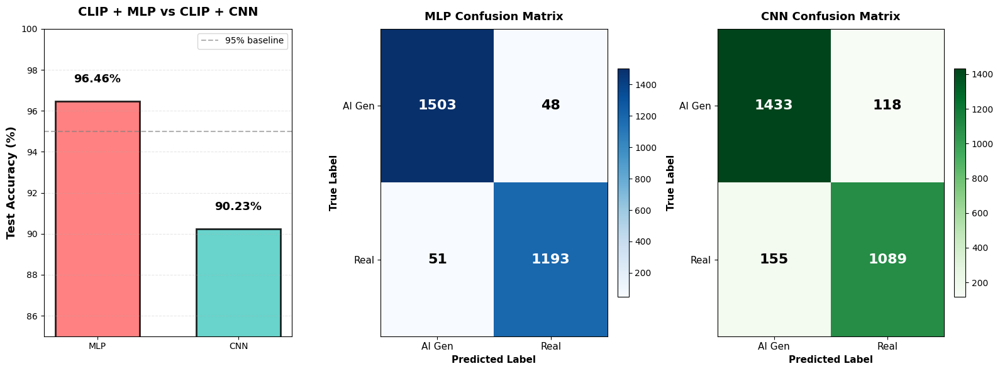


✅ MLP Test Accuracy:  96.46%
✅ CNN Test Accuracy:  90.23%
📊 Difference:         6.23% (MLP advantage)

📈 MLP Parameters:     459,650
📈 CNN Parameters:     174,082


       Class Model Precision Recall F1-Score
AI Generated   MLP     0.967  0.969    0.968
AI Generated   CNN     0.902  0.924    0.913
 Real Images   MLP     0.961  0.959    0.960
 Real Images   CNN     0.902  0.875    0.889

MLP Confusion Matrix:
  True AI → Pred AI:    1503 (correct)
  True AI → Pred Real:    48 (false negative)
  True Real → Pred AI:    51 (false positive)
  True Real → Pred Real:1193 (correct)

CNN Confusion Matrix:
  True AI → Pred AI:    1433 (correct)
  True AI → Pred Real:   118 (false negative)
  True Real → Pred AI:   155 (false positive)
  True Real → Pred Real:1089 (correct)


In [ ]:
# ============================================================================
# COMPLETE COMPARISON: MLP vs CNN
# ============================================================================

# STEP 1: Get MLP predictions
@torch.no_grad()
def get_mlp_predictions(dl):
    """Get MLP predictions for comparison"""
    model.eval()  # MLP model
    all_preds, all_true = [], []

    for xb, yb in dl:
        xb, yb = xb.to(device), yb.to(device)
        logits = model(xb)  # MLP forward pass
        preds = logits.argmax(1)
        all_preds.append(preds.cpu())
        all_true.append(yb.cpu())

    return torch.cat(all_preds), torch.cat(all_true)

# Get MLP predictions
mlp_test_preds, mlp_test_labels = get_mlp_predictions(test_dl)

# STEP 2: Calculate accuracies and metrics
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support

# Calculate test accuracies
mlp_test_acc = (mlp_test_preds == mlp_test_labels).float().mean().item()
cnn_test_acc = (cnn_test_preds == cnn_test_labels).float().mean().item()

# Get confusion matrices
mlp_cm = confusion_matrix(mlp_test_labels.numpy(), mlp_test_preds.numpy())
cnn_cm = confusion_matrix(cnn_test_labels.numpy(), cnn_test_preds.numpy())

# Get per-class metrics
mlp_precision, mlp_recall, mlp_f1, _ = precision_recall_fscore_support(
    mlp_test_labels.numpy(),
    mlp_test_preds.numpy(),
    average=None
)

cnn_precision, cnn_recall, cnn_f1, _ = precision_recall_fscore_support(
    cnn_test_labels.numpy(),
    cnn_test_preds.numpy(),
    average=None
)

# STEP 3: Print comparison table
import pandas as pd

comparison = {
    'Model': ['CLIP + MLP', 'CLIP + CNN'],
    'Test Accuracy': [f"{mlp_test_acc:.4f}", f"{cnn_test_acc:.4f}"],
    'Test Accuracy (%)': [f"{mlp_test_acc*100:.2f}%", f"{cnn_test_acc*100:.2f}%"],
    'Parameters': [
        f"{sum(p.numel() for p in model.parameters()):,}",
        f"{sum(p.numel() for p in cnn_model.parameters()):,}"
    ]
}

df = pd.DataFrame(comparison)
print("\n")
print(df.to_string(index=False))

# STEP 4: Create visualizations
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize=(16, 6))

# ----------------------------------------------------------------------------
# Plot 1: Accuracy Bar Chart
# ----------------------------------------------------------------------------
ax1 = plt.subplot(1, 3, 1)

models = ['MLP', 'CNN']
accuracies = [mlp_test_acc * 100, cnn_test_acc * 100]
colors = ['#FF6B6B', '#4ECDC4']

bars = ax1.bar(models, accuracies, color=colors, alpha=0.85,
               edgecolor='black', linewidth=2, width=0.6)

ax1.set_ylabel('Test Accuracy (%)', fontsize=13, fontweight='bold')
ax1.set_title('CLIP + MLP vs CLIP + CNN', fontsize=14, fontweight='bold', pad=15)
ax1.set_ylim([85, 100])
ax1.axhline(y=95, color='gray', linestyle='--', linewidth=1.5, alpha=0.6, label='95% baseline')
ax1.grid(axis='y', alpha=0.3, linestyle='--')
ax1.legend(fontsize=10)

# Add value labels on bars
for i, (bar, acc) in enumerate(zip(bars, accuracies)):
    ax1.text(bar.get_x() + bar.get_width()/2, acc + 0.8,
            f"{acc:.2f}%", ha='center', va='bottom',
            fontsize=13, fontweight='bold', color='black')

# ----------------------------------------------------------------------------
# Plot 2: MLP Confusion Matrix
# ----------------------------------------------------------------------------
ax2 = plt.subplot(1, 3, 2)

im2 = ax2.imshow(mlp_cm, interpolation='nearest', cmap='Blues', aspect='auto')
ax2.set_title('MLP Confusion Matrix', fontsize=13, fontweight='bold', pad=10)

# Add labels
classes = ['AI Gen', 'Real']
tick_marks = np.arange(len(classes))
ax2.set_xticks(tick_marks)
ax2.set_yticks(tick_marks)
ax2.set_xticklabels(classes, fontsize=11)
ax2.set_yticklabels(classes, fontsize=11)
ax2.set_xlabel('Predicted Label', fontsize=11, fontweight='bold')
ax2.set_ylabel('True Label', fontsize=11, fontweight='bold')

# Add text annotations
thresh = mlp_cm.max() / 2.
for i in range(len(classes)):
    for j in range(len(classes)):
        text_color = "white" if mlp_cm[i, j] > thresh else "black"
        ax2.text(j, i, f'{mlp_cm[i, j]}',
                ha="center", va="center",
                fontsize=16, fontweight='bold',
                color=text_color)

plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

# ----------------------------------------------------------------------------
# Plot 3: CNN Confusion Matrix
# ----------------------------------------------------------------------------
ax3 = plt.subplot(1, 3, 3)

im3 = ax3.imshow(cnn_cm, interpolation='nearest', cmap='Greens', aspect='auto')
ax3.set_title('CNN Confusion Matrix', fontsize=13, fontweight='bold', pad=10)

# Add labels
ax3.set_xticks(tick_marks)
ax3.set_yticks(tick_marks)
ax3.set_xticklabels(classes, fontsize=11)
ax3.set_yticklabels(classes, fontsize=11)
ax3.set_xlabel('Predicted Label', fontsize=11, fontweight='bold')
ax3.set_ylabel('True Label', fontsize=11, fontweight='bold')

# Add text annotations
thresh = cnn_cm.max() / 2.
for i in range(len(classes)):
    for j in range(len(classes)):
        text_color = "white" if cnn_cm[i, j] > thresh else "black"
        ax3.text(j, i, f'{cnn_cm[i, j]}',
                ha="center", va="center",
                fontsize=16, fontweight='bold',
                color=text_color)

plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# STEP 5: Metrics comparison
diff = (mlp_test_acc - cnn_test_acc) * 100

print(f"\n✅ MLP Test Accuracy:  {mlp_test_acc*100:.2f}%")
print(f"✅ CNN Test Accuracy:  {cnn_test_acc*100:.2f}%")
print(f"📊 Difference:         {diff:.2f}% (MLP advantage)")
print(f"\n📈 MLP Parameters:     {sum(p.numel() for p in model.parameters()):,}")
print(f"📈 CNN Parameters:     {sum(p.numel() for p in cnn_model.parameters()):,}")

metrics_comparison = pd.DataFrame({
    'Class': ['AI Generated', 'AI Generated', 'Real Images', 'Real Images'],
    'Model': ['MLP', 'CNN', 'MLP', 'CNN'],
    'Precision': [f"{mlp_precision[0]:.3f}", f"{cnn_precision[0]:.3f}",
                  f"{mlp_precision[1]:.3f}", f"{cnn_precision[1]:.3f}"],
    'Recall': [f"{mlp_recall[0]:.3f}", f"{cnn_recall[0]:.3f}",
               f"{mlp_recall[1]:.3f}", f"{cnn_recall[1]:.3f}"],
    'F1-Score': [f"{mlp_f1[0]:.3f}", f"{cnn_f1[0]:.3f}",
                 f"{mlp_f1[1]:.3f}", f"{cnn_f1[1]:.3f}"]
})

print("\n")
print(metrics_comparison.to_string(index=False))

# STEP 6: Confusion matrix analysis
print("\nMLP Confusion Matrix:")
print(f"  True AI → Pred AI:    {mlp_cm[0,0]:4d} (correct)")
print(f"  True AI → Pred Real:  {mlp_cm[0,1]:4d} (false negative)")
print(f"  True Real → Pred AI:  {mlp_cm[1,0]:4d} (false positive)")
print(f"  True Real → Pred Real:{mlp_cm[1,1]:4d} (correct)")

print("\nCNN Confusion Matrix:")
print(f"  True AI → Pred AI:    {cnn_cm[0,0]:4d} (correct)")
print(f"  True AI → Pred Real:  {cnn_cm[0,1]:4d} (false negative)")
print(f"  True Real → Pred AI:  {cnn_cm[1,0]:4d} (false positive)")
print(f"  True Real → Pred Real:{cnn_cm[1,1]:4d} (correct)")


### Grad-CAM on VAE latent texture encodes (focuses on brush strokes, edges, patterns, etc)

Run Grad-CAM on pipe.vae.encoder — the variational autoencoder encoder inside img2img-turbo / Stable Diffusion Turbo.
This encoder compresses every image into a latent representation (a dense 4×64×64 map of features).

The VAE encoder learns low-level visual statistics:

- brush-stroke density

- lighting gradients

- color-mix variance

- local texture “roughness” or “smoothness”

These features are not semantic — they describe how something looks, not what it is.

**When we back-propagate through the encoder, Grad-CAM produces a heatmap showing where the network relies most to define an image’s stylistic identity.**

In [ ]:
!pip install grad-cam --quiet

🖼 Selected examples:
 - data/ai_art_split/test/NON_AI_GENERATED/12392.jpg
 - data/ai_art_split/test/NON_AI_GENERATED/3757.jpg
 - data/ai_art_split/test/AI_GENERATED/2029.jpg
 - data/ai_art_split/test/AI_GENERATED/10577.jpg


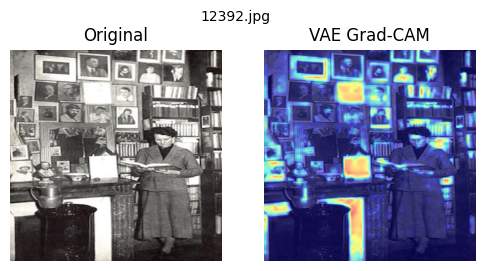

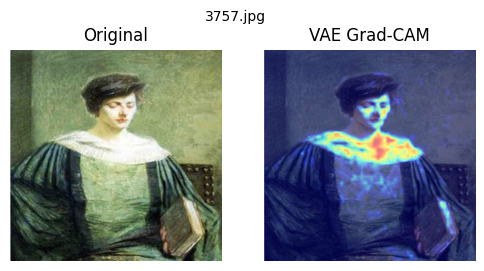

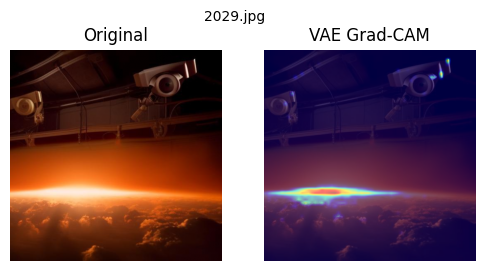

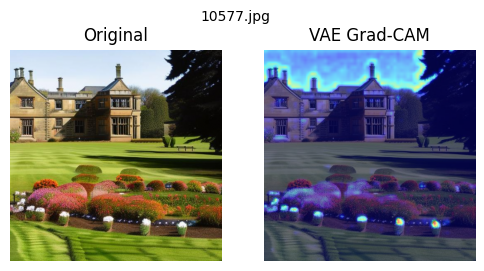

In [ ]:
import torch, numpy as np, os, random
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

# --- select test samples ---
test_human_dir = "data/ai_art_split/test/NON_AI_GENERATED"
test_ai_dir    = "data/ai_art_split/test/AI_GENERATED"
human_examples = random.sample(os.listdir(test_human_dir), 2)
ai_examples    = random.sample(os.listdir(test_ai_dir), 2)
example_paths  = [os.path.join(test_human_dir, f) for f in human_examples] + \
                 [os.path.join(test_ai_dir, f) for f in ai_examples]

print("Selected examples:")
for e in example_paths: print(" -", e)

# --- transform setup ---
vae_tfms = transforms.Compose([
    transforms.Resize((512,512), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: t * 2.0 - 1.0)
])

# Grad-CAM setup for Stable Diffusion Turbo VAE encoder
target_layer = pipe.vae.encoder.down_blocks[-1].resnets[-1]
cam = GradCAM(model=pipe.vae.encoder, target_layers=[target_layer])

# dummy target (since VAE isn't a classifier)
class DummyTarget:
    def __call__(self, model_output):
        # Use average activation as a scalar target
        return model_output.mean()

# visualize
for path in example_paths:
    pil_img = Image.open(path).convert("RGB")
    img_tensor = vae_tfms(pil_img).unsqueeze(0).to(device, dtype=pipe.vae.dtype)

    # manually encode
    posterior = pipe.vae.encode(img_tensor)
    latent = posterior.latent_dist.mean

    # run Grad-CAM
    grayscale_cam = cam(input_tensor=img_tensor, targets=[DummyTarget()])[0]

    rgb_img = np.array(pil_img.resize((512,512))) / 255.0
    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1); plt.imshow(rgb_img); plt.title("Original"); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(cam_image); plt.title("VAE Grad-CAM"); plt.axis('off')
    plt.suptitle(os.path.basename(path), fontsize=10)
    plt.show()